In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn import datasets
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics
import lime
import lime.lime_tabular
from __future__ import print_function
np.random.seed(1)
import shap
from sklearn.base import clone
from rfpimp import *
from explainerdashboard import ClassifierExplainer, ExplainerDashboard


The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`

The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`


In [2]:
df = pd.read_excel('C:/Users/orkad/Desktop/stage emmanuel/datasets/datasets avec classe autre/data_bos_dashboard.xlsx')
df = df.rename(columns = {'Unnamed: 0': 'label'})
df = df.fillna(0)
df

,label,698_35785,722_35848,728_33232,758_3665,785_38418,836_43779,837_40636,840_46876,841_43774,...,4306_00638,4318_04355,4348_11426,4349_0937,4364_10736,4365_08841,4391_11539,4493_13648,4507_14918,4523_14453
0,auroch(9).s1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,702196.0,0.0,0.0,1670608.0,0.0,0.0,0.0,1236710.0,0.0
1,auroch(9).s2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,665245.0,271586.0,0.0,1331688.0,0.0,0.0,0.0,1030345.0,0.0
2,auroch(9).s3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,527328.0,0.0,0.0,1379494.0,0.0,0.0,0.0,968308.0,294259.0
3,aurochs T,0.0,0.0,0.0,0.0,0.0,171536.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,C1-1,0.0,0.0,0.0,297097.0,0.0,0.0,1009697.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117,boeuf2,272948.0,364171.0,0.0,0.0,0.0,488184.0,0.0,0.0,0.0,...,0.0,1978295.0,2339961.0,0.0,3686455.0,0.0,0.0,0.0,0.0,941688.0
118,boeuf2.s1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,681073.0,1012127.0,0.0,2037258.0,0.0,0.0,0.0,0.0,0.0
119,boeuf2.s2,0.0,0.0,0.0,0.0,0.0,520637.0,0.0,0.0,0.0,...,0.0,514121.0,814359.0,0.0,1422462.0,0.0,0.0,0.0,0.0,0.0
120,boeuf2.s3,0.0,0.0,0.0,0.0,0.0,624307.0,0.0,192693.0,0.0,...,0.0,607670.0,1101976.0,0.0,1994926.0,0.0,0.0,0.0,0.0,0.0


In [3]:
n = len(df.index)

x = 0
while x < n:
    a = 'boeuf' in df.iloc[x,0]
    b = 'B1' in df.iloc[x,0] 
    c = 'B2' in df.iloc[x,0]
    d = 'B3' in df.iloc[x,0]
    e = 'B4' in df.iloc[x,0]
    f = 'B5' in df.iloc[x,0]
    g = 'B6' in df.iloc[x,0]
    h = 'auroch' in df.iloc[x,0]
    i = 'C1' in df.iloc[x,0]
    j = 'C2' in df.iloc[x,0]
    k = 'C3' in df.iloc[x,0]
    l = 'C4' in df.iloc[x,0]
    m = 'C5' in df.iloc[x,0]
    o = 'C6' in df.iloc[x,0]
    if a or b or c or d or e or f or g == True :
        df.iloc[x,0] = 'boeuf'
    elif h or i or j or k or l or m or o== True :
        df.iloc[x,0] = 'auroch'
    else:
        df.iloc[x,0] = 'autre' 
    x = x+1

In [5]:
df['label'], uniques = pd.factorize(df['label']) # on appel une autre variale afin d'y inclure l'Index
y = df['label']
X = df.drop('label', axis=1)

In [6]:
X = X.apply(lambda x: x/x.max(), axis=1)  # pour base de données normalisé par le maximum de la ligne
#X = X.apply(lambda x: [1 if x > 0 else 0 for x in x]) # pour base de données normalisé par 0 et 1
#X = X.to_numpy()

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.80, test_size=0.20, random_state=0, stratify=y)

In [7]:
clf = RandomForestClassifier(n_estimators=100, random_state=0)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
print("f-mesure:", metrics.f1_score(y_test, y_pred, average='micro'))
print(metrics.classification_report(y_test, y_pred))
metrics.accuracy_score(y_test, y_pred)

Accuracy: 0.96
f-mesure: 0.96
              precision    recall  f1-score   support

      auroch       1.00      0.80      0.89         5
       autre       0.92      1.00      0.96        12
       boeuf       1.00      1.00      1.00         8

    accuracy                           0.96        25
   macro avg       0.97      0.93      0.95        25
weighted avg       0.96      0.96      0.96        25



0.96

In [8]:
importances = clf.feature_importances_
forest_importances = pd.Series(importances, index=X.columns.tolist())
forest_importances.sort_values(ascending = False).nlargest(n=10)

2883_42332    0.061816
2899_42206    0.030700
2487_20913    0.030616
2853_40783    0.029301
2767_32014    0.021530
1180_64381    0.020658
3084_41417    0.017546
1196_63859    0.016630
3100_41204    0.016502
1208_67479    0.016257
dtype: float64

In [18]:
classe = df.drop('label', axis=1)
classe = classe.columns.tolist()
feature = clf.classes_
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=classe, class_names=clf.classes_, discretize_continuous=True)

i = np.random.randint(0, X_test.shape[0])
exp = explainer.explain_instance(X_test[i], clf.predict_proba, num_features=10, top_labels=4)

exp.show_in_notebook(show_table=True, show_all=False)


In [41]:
import warnings
warnings.filterwarnings('ignore')

def mkdf(columns, importances):
    I = pd.DataFrame(data={'Feature':columns, 'Importance':importances})
    I = I.set_index('Feature')
    I = I.sort_values('Importance', ascending=False)
    return I

0.8181818181818182
0.797979797979798


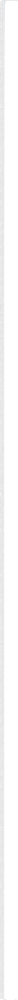

In [20]:
base_rf = RandomForestClassifier(n_estimators=100,
                                 min_samples_leaf=5,
                                 n_jobs=-1,
                                 oob_score=True)

rf = clone(base_rf)
rf.fit(X_train, y_train)
print(rf.oob_score_)
I = mkdf(X_train.columns,rf.feature_importances_)            
viz = plot_importances(I, imp_range=(0,.4), title="Feature importance via avg drop in variance (sklearn)")
viz.save('C:/Users/orkad/Desktop/stage emmanuel/travail/image graph/cls_dflt.svg')
viz.close()

X_train2 = X_train.copy()
X_train2['random'] = np.random.random(size=len(X_train2))
rf2 = clone(base_rf)
rf2.fit(X_train2, y_train)
print(rf2.oob_score_)
I = mkdf(X_train2.columns,rf2.feature_importances_)
viz = plot_importances(I, imp_range=(0,.4), title="Feature importance via avg drop in variance (sklearn)")
viz.save('C:/Users/orkad/Desktop/stage emmanuel/travail/image graph/cls_dflt_random.svg')
viz

In [ ]:
ExplainerDashboard(ClassifierExplainer(RandomForestClassifier(n_estimators=100, random_state=0).fit(X_train, y_train), X_test, y_test),n_jobs=-1,shap_interaction=False, no_permutations=True).run()

Detected RandomForestClassifier model: Changing class type to RandomForestClassifierExplainer...
Note: model_output=='probability', so assuming that raw shap output of RandomForestClassifier is in probability space...
Generating self.shap_explainer = shap.TreeExplainer(model)
Building ExplainerDashboard..
Detected notebook environment, consider setting mode='external', mode='inline' or mode='jupyterlab' to keep the notebook interactive while the dashboard is running...
Generating layout...
Calculating shap values...
Calculating prediction probabilities...
Calculating metrics...
Calculating confusion matrices...
Calculating classification_dfs...
Calculating roc auc curves...
Calculating pr auc curves...
Calculating liftcurve_dfs...
Calculating dependencies...
Calculating predictions...
Calculating pred_percentiles...
Calculating ShadowDecTree for each individual decision tree...
Reminder: you can store the explainer (including calculated dependencies) with explainer.dump('explainer.jobl

 * Running on all addresses.
 * Running on http://134.206.154.14:8050/ (Press CTRL+C to quit)
134.206.154.14 - - [24/Aug/2022 10:26:33] "GET / HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:26:33] "GET /assets/bootstrap.min.css?m=1661246111.247593 HTTP/1.1" 304 -
134.206.154.14 - - [24/Aug/2022 10:26:33] "GET /_dash-layout HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:26:33] "GET /_dash-dependencies HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:26:33] "GET /_dash-component-suites/dash/dcc/async-dropdown.js HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:26:33] "GET /_dash-component-suites/dash/dcc/async-graph.js HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:26:33] "GET /_dash-component-suites/dash/dcc/async-plotlyjs.js HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:26:35] "POST /_dash-update-component HTTP/1.1" 204 -
134.206.154.14 - - [24/Aug/2022 10:26:35] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:26:35] "POST /_dash-up

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but Dec

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

134.206.154.14 - - [24/Aug/2022 10:43:16] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionT

134.206.154.14 - - [24/Aug/2022 10:43:17] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:43:17] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:43:17] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:43:17] "POST /_dash-update-component HTTP/1.1" 204 -
134.206.154.14 - - [24/Aug/2022 10:43:17] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:43:17] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:43:17] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:43:17] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1)

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

134.206.154.14 - - [24/Aug/2022 10:43:30

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

134.206.154.14 - - [24/Aug/2022 10:43:34] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of callin

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

134.206.154.14 - - [24/Aug/2022 10:43:39] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:43:39] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/A

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

134.206.154.14 - - [24/Aug/2022 10:43:43] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

134.206.154.14 - - [24/Aug/2022 10:43:43] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:43:46] "POST /_dash-update-component HTTP/1.1" 200 -
C:

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

134.206.154.14 - - [24/Aug/2022 10:43:48] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionT

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

134.206.154.14 - - [24/Aug/2022 10:43:48] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:43:48] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:43:48] "POST /_dash-update-component HTTP/1.1" 204 -
C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: Performa

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

134.206.154.14 - - [24/Aug/2022 10:44:29] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionT

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

134.206.154.14 - - [24/Aug/2022 10:44:31] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:44:31] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:44:31] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:44:31] "POST /_dash-update-component HTTP/1.1" 204 -
C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

134.206.154.14 - - [24/Aug/2022 10:44:31] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:44:31] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:44:31] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - 

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

134.206.154.14 - - [24/Aug/2022 10:44:35] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:02] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

134.206.154.14 - - [24/Aug/2022 10:45:05] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionT

134.206.154.14 - - [24/Aug/2022 10:45:06] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:06] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:06] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

134.206.154.14 - - [24/Aug/2022 10:45:06] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

134.206.154.14 - - [24/Aug/2022 10:45:09] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

134.206.154.14 - - [24/Aug/2022 10:45:09] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:18] "POST /_dash-update-component HTTP/1.1" 200 -
C:

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

134.206.154.14 - - [24/Aug/2022 10:45:21] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:21] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:21] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

134.206.154.14 - - [24/Aug/2022 10:45:22] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:22] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:22] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:22] "POST /_dash-update-component HTTP/1.1" 204 -
134.206.154.14 - 

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

134.206.154.14 - - [24/Aug/2022 10:45:25] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of callin

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

134.206.154.14 - - [24/Aug/2022 10:45:26] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:26] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

134.206.154.14 - - [24/Aug/2022 10:45:27] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

13

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

134.206.154.14 - - [24/Aug/2022 10:45:30] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:34] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packag

134.206.154.14 - - [24/Aug/2022 10:45:37] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:38] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:38] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:38] "POST /_dash-update-component HTTP/1.1C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

" 204 -
134.206.154.14 - - [24/Aug/2022 10:45:38] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:38] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 10:45:38] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\an

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

134.206.154.14 - - [24/Aug/2022 17:15:26] "POST /_dash-update-component HTTP/1.1" 200 -
C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

C:\Users\orkad\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning:

X has feature names, but DecisionT

134.206.154.14 - - [24/Aug/2022 17:15:26] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 17:15:26] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 17:15:26] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 17:15:26] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 17:15:26] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 17:15:26] "POST /_dash-update-component HTTP/1.1" 204 -
C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

134.206.154.14 - - [24/Aug/2022 17:15:27] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - 

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\orkad\anaconda3\lib\site-packages\explainerdashboard\explainer_methods.py:392: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns a

134.206.154.14 - - [24/Aug/2022 17:15:30] "POST /_dash-update-component HTTP/1.1" 200 -
134.206.154.14 - - [24/Aug/2022 17:15:30] "POST /_dash-update-component HTTP/1.1" 200 -
